# RecipeNet 
## Seperate CNN and LSTM networks

A network with several layers Convolutional LSTM layers, trained on sequences of images.

Adapted from the LSTM model described here: https://blog.coast.ai/five-video-classification-methods-implemented-in-keras-and-tensorflow-99cad29cc0b5 and the accompanying github repo.

This model is still at base an LSTM network of CNNs, applied to a sequence of images. However, to get around memory issues, the CNN and LSTM steps are applied **seperately**. First a headless version of the CNN (InceptionV3) is applied to the sequence of images, and the output - a string to 2048 weights per image - is saved to a csv file. Then the LSTM is trained and test with those CSV files.

(Side note - it's not clear if this two-stage architechture is nessacry for work. The justification for the original code was memory issues, as he was working with longer sequences of 40 images. This is a area currently being looked into)

**Modifications**:

Most of the modifications are around the data.py file, which handles loading the data and matching images with generated CSV files. Though these changes are relfected in other files, to adapt to the changes in data.py
Other changes:
- Added an L1L2 regularizer to the kernal weights to avoid overfitting (l1=0.01, l2 = 0.01)
- Switched max sequence length to 10
- Changed models.py to load a weights file instead of a model file, as that's what saved by the training process

**Training Details**

Trained using the Adam optimizer with a learning rate of 1e-6, and categorical crossentropy loss for 45 epochs, each epoch consisted of 1044 sample sequences of images. Images were resized to 100x100px.

Recipe sequences were recipe steps taken in order, with the final recipe image as the last. Non-recipe sequences were random sequences of final meal images, taken from the same set as recipe sequences. The network was trained to respond with `0` if the sequence was from the `recipes` set. These sequences of images had their features extracted with InceptionV3 in CSV files, and it was though CSV files which the LSTM model was trained. The pre-trained version of InceptionV3 was used, and left unchanged in the process.

During training, sequences were limited to 10 images each. Shorter sequences were padded with fully white images. There was no data augmentation and no validation. Longer sequences were downsampled to 10.

After 45 epochs, the accuracy on training data was 0.90.

**This Notebook**

Here we apply the trained notebook on the training data to see it's performance. The feature extraction using the CNN is already done, so you only need the CSV files of features. However, to display the sequences, the original images are also required.

In [1]:
# imports

import keras
import os, sys
import numpy as np
import random
from PIL import Image
import pandas as pd

Using TensorFlow backend.


In [29]:
sys.path.append('/Users/oisin-brogan/Code/five-video-classification-methods/')
from models import ResearchModels

Some constants used in this demonstration:

In [3]:
# image width and height in px for display
target_size = 100    

# sequences longer than this will be cut
max_seq_length = 10

# cutoff to say "recipe"
THRESHOLD = 0.6

In [4]:
# Load the saved Recipenet model
from keras import backend as K
#K.set_learning_phase(0)
recipenet = ResearchModels(2, 'lstm', 10, '/Users/oisin-brogan/Downloads/lstm-features.045-1.990.hdf5')

Loading LSTM model.
Loading model /Users/oisin-brogan/Downloads/lstm-features.045-1.990.hdf5


In [5]:
# The following loads all images in a given folder and returns a Numpy array of resized RGB image data

from keras.preprocessing.image import img_to_array, load_img

def folder_to_array(path):
    # let's exclude the final recipe image to make things interesting
    x = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('jpg') or f.endswith('jpeg')])
    x = [img_to_array(load_img(path, target_size=(target_size, target_size))) for path in x]
    if len(x) > max_seq_length:
        x = x[-max_seq_length:]
    return np.array(x)

In [6]:
# The network returns 0 for recipes due to math thing in binary crossentropy loss that I heard about somewhere
def infer(data):
    return 1 - np.squeeze(recipenet.classify(np.array([data])))

In [7]:
# Take a folder with sequences in subfolders, judge them all

from IPython.core.display import display, HTML
from tqdm import tqdm


def judge_folder(path, ground_truth):
    # get all subfolders
    samples = [os.path.join(path, d) for d in os.listdir(path) if os.path.isfile(os.path.join(path, d))]
    stats = []
    for sample in tqdm(samples):
        # read sequences of CNN output into array
        features = pd.read_csv(sample, sep=" ", header=None)
        data = features.values
        score = np.squeeze(recipenet.model.predict(np.array([data])))

        stats.append((sample, score[1], ground_truth))
    return stats

## Recipe samples

Recipes are taken from global Cookpad database

In [8]:
recipe_stats = judge_folder('/Users/oisin-brogan/Downloads/test_sequences/recipe/', True)

100%|██████████| 124/124 [00:15<00:00,  8.13it/s]


## Non-recipes

Non-recipes are sets of plated meal images from Cookpad.

In [9]:
nonrecipe_stats = judge_folder('/Users/oisin-brogan/Downloads/test_sequences/non-recipe', False)

100%|██████████| 150/150 [00:19<00:00,  8.15it/s]


## Visualization

In [10]:
import pandas as pd

stats = pd.DataFrame(recipe_stats + nonrecipe_stats, columns=['sample', 'score', 'is_recipe']).sort_values(by='score', ascending=0)
stats.sample(5)

,sample,score,is_recipe
59,/Users/oisin-brogan/Downloads/test_sequences/r...,0.640136,True
1,/Users/oisin-brogan/Downloads/test_sequences/r...,0.943056,True
142,/Users/oisin-brogan/Downloads/test_sequences/n...,0.262101,False
266,/Users/oisin-brogan/Downloads/test_sequences/n...,0.180357,False
215,/Users/oisin-brogan/Downloads/test_sequences/n...,0.019009,False


In [11]:
# This is to display a row of images from a Numpy array

import matplotlib.pyplot as plt
%matplotlib inline  

def display_row(row, threshold=THRESHOLD):
    message = ''
    if row['score'] < threshold and row['is_recipe']:
        message = 'FALSE NEGATIVE'
    if row['score'] > threshold and not row['is_recipe']:
        message = 'FALSE POSITIVE'
    display(HTML('{} score={:.2f}% <font color="red"><b>{}</b></font>'.format(row['sample'], 100*row['score'], message) ))
    split = row['sample'].split('/')
    split[4] = 'test'
    split[-1] = split[-1][:split[-1].index('-')]
    path = '/'.join(split)
    array = folder_to_array(path)
    fig = plt.figure(figsize=(17, 3))
    for index, img in enumerate(array):
        a=fig.add_subplot(1, len(array), index + 1)
        plt.imshow(-img)
        plt.axis('off')
    plt.show()
    display(HTML('<hr>'))

def display_images(df, threshold=THRESHOLD):
    for idx, row in df.iterrows():
        display_row(row, threshold)

## Most recipe-like

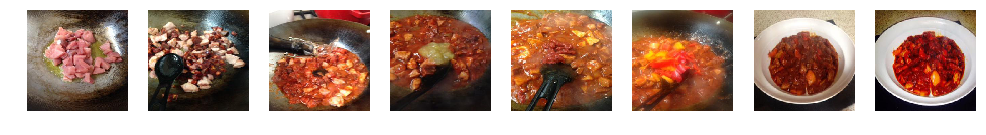

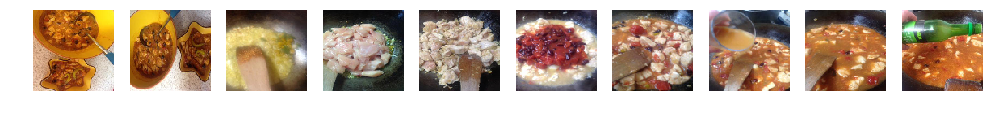

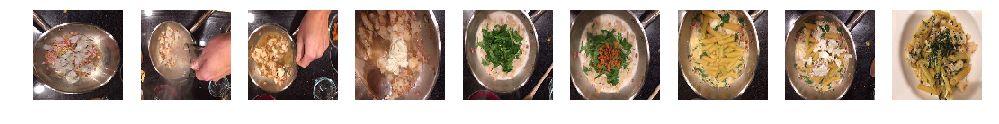

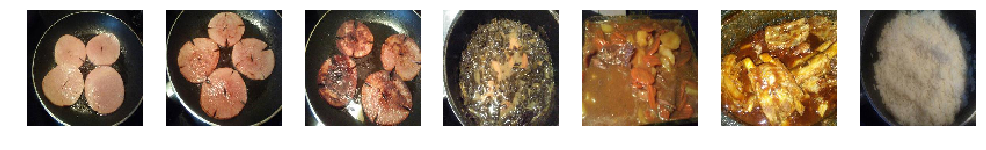

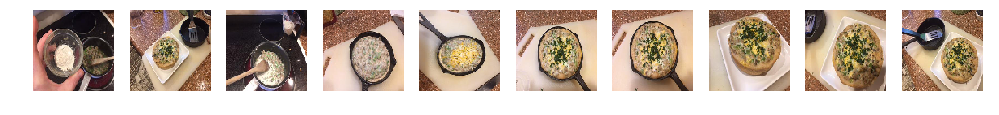

In [12]:
# Commenting out to avoid displaying private images
display_images(stats.head(5))

## Least recipe-like

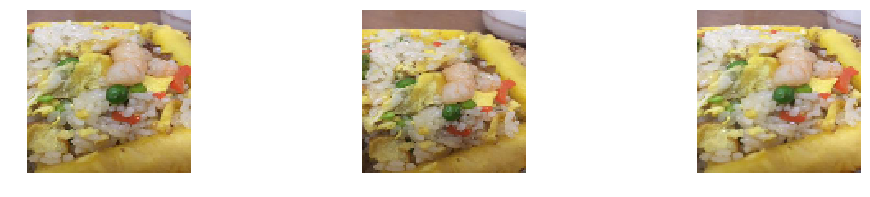

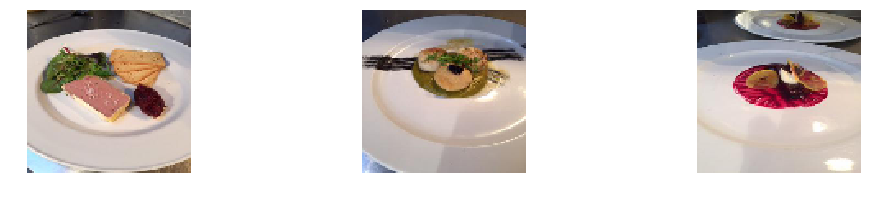

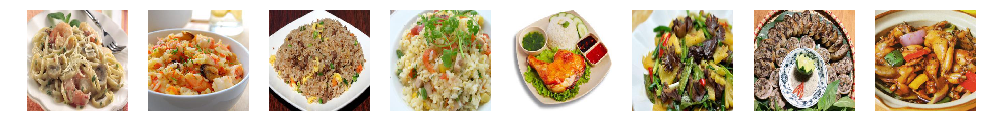

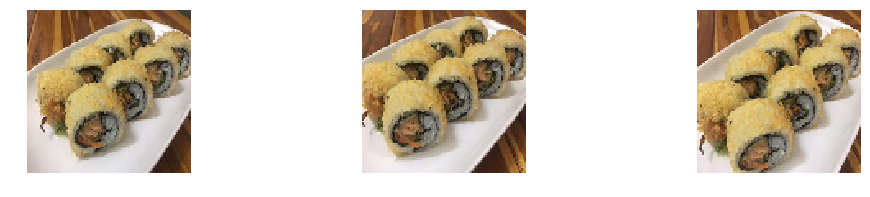

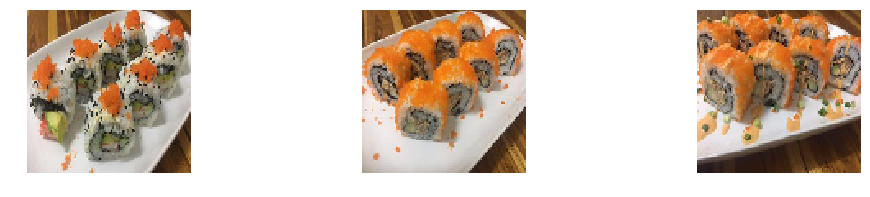

In [13]:
display_images(stats.tail(5))

## False Positives

/Users/oisin-brogan/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


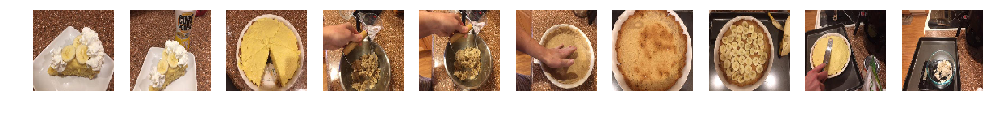

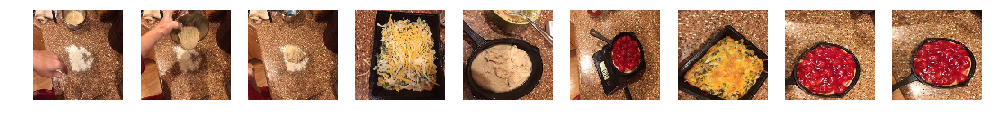

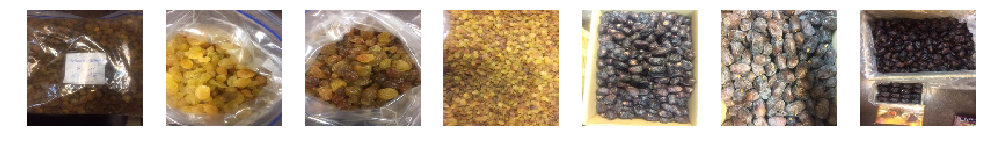

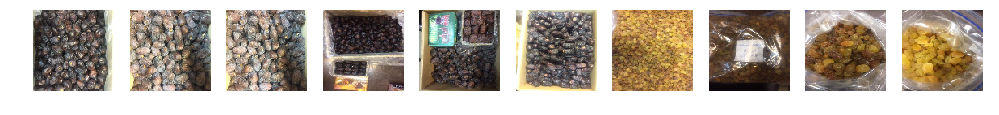

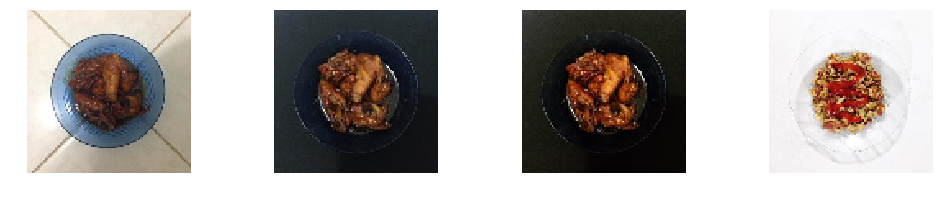

...

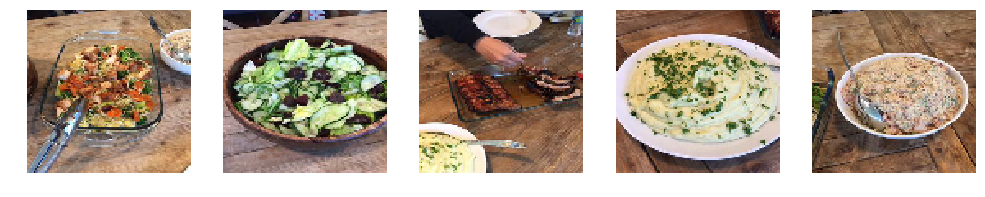

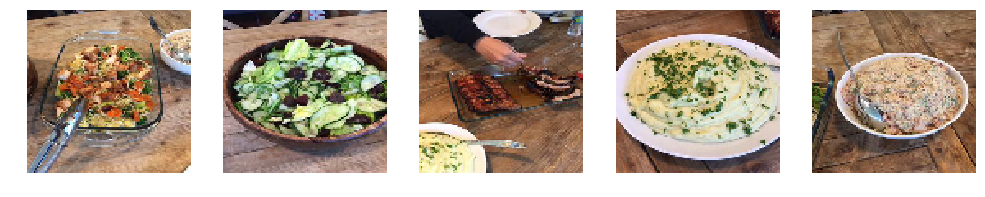

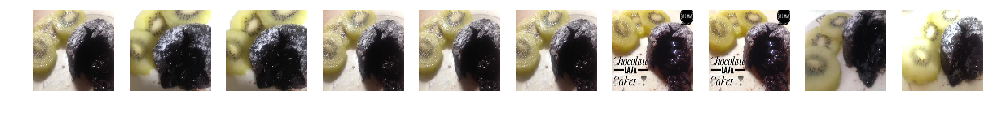

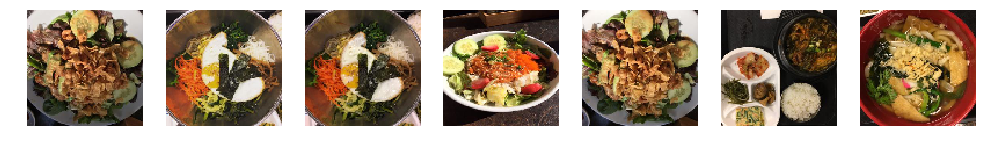

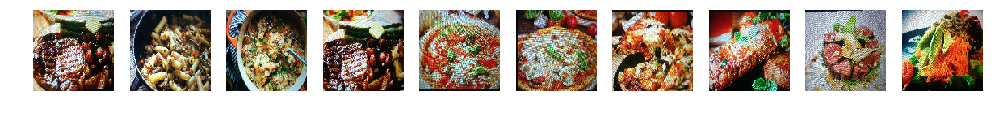

24

In [14]:
false_positives = stats[stats.is_recipe==False][stats.score>THRESHOLD]
display_images(false_positives)
len(false_positives)

## False Negatives

/Users/oisin-brogan/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


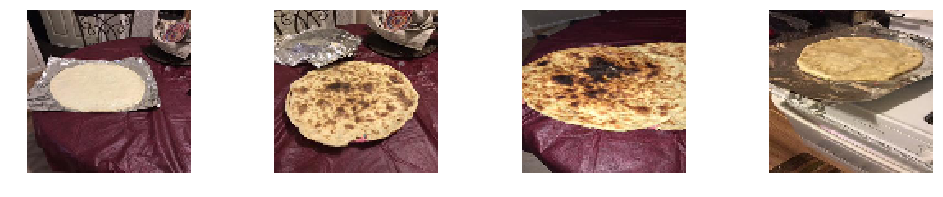

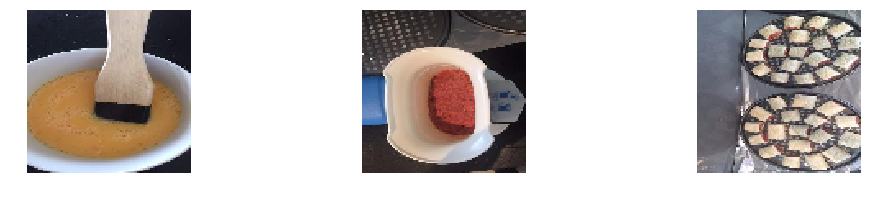

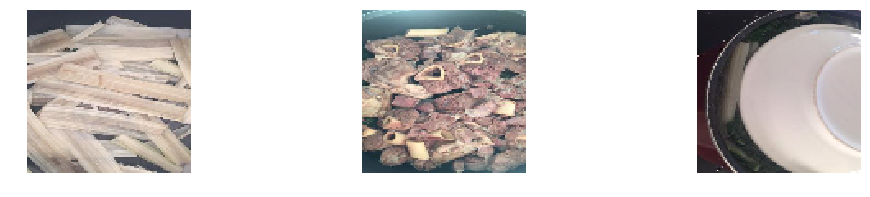

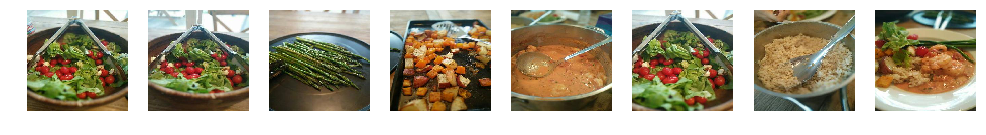

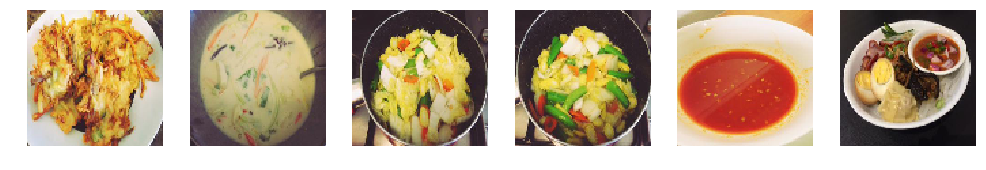

...

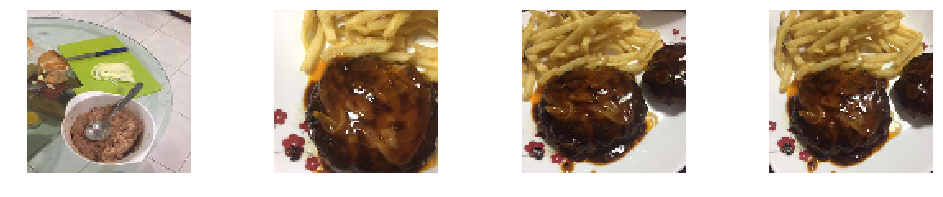

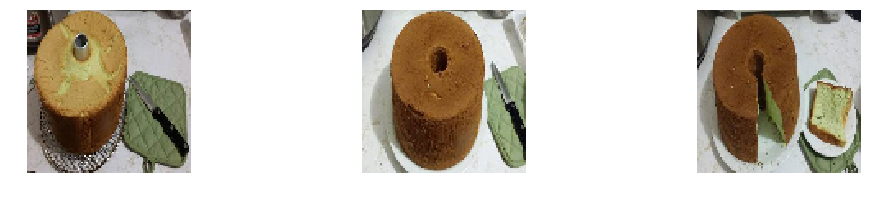

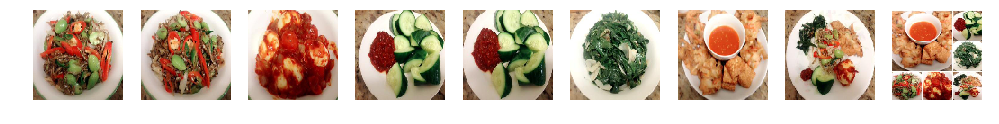

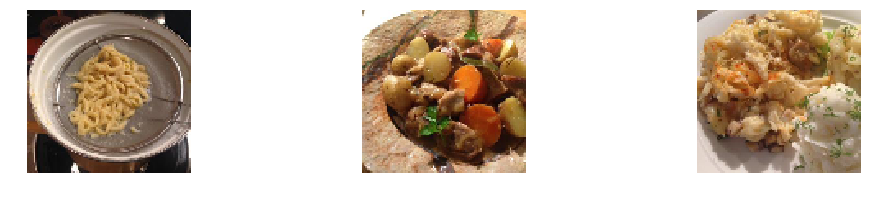

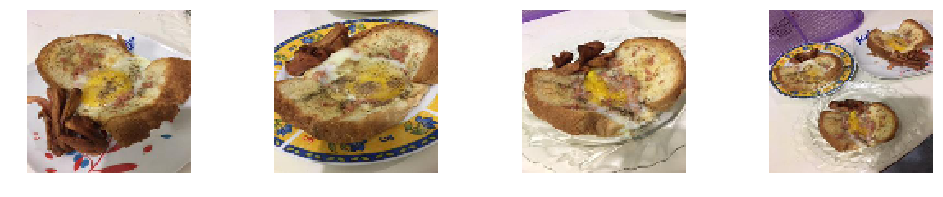

In [15]:
false_negatives = stats[stats.is_recipe==True][stats.score<THRESHOLD]
len(false_negatives)
display_images(false_negatives)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x11fa190b8>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x11e69a828>], dtype=object)

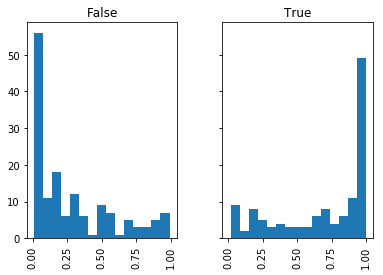

In [16]:
stats.hist(by='is_recipe', stacked=True, column='score', sharex=True, sharey=True, bins=15)

Left hand side: score histogram for non-recipes. Right hand side: score histogram for recipes.

In [17]:
def stats_by_threshold(threshold):
    positives = stats[stats.score >= threshold]
    negatives = stats[stats.score < threshold]
    true_positives = len(positives[positives.is_recipe == True])
    false_positives = len(positives[positives.is_recipe == False])
    true_negatives = len(negatives[negatives.is_recipe == False])
    false_negatives = len(negatives[negatives.is_recipe == True])
    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    accuracy = (true_positives + true_negatives) / (len(stats))
    return {
        'threshold': threshold,
        'true_positive_rate': true_positives / len(positives),
        'false_positive_rate': false_positives / len(positives),
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall
    }

results = pd.DataFrame([stats_by_threshold(threshold/100) for threshold in range(100)]).set_index(['threshold'])

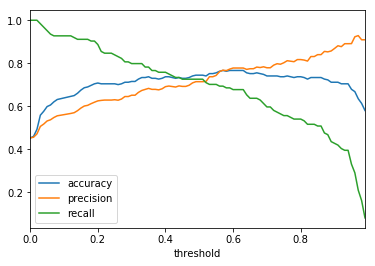

In [18]:
results[['accuracy', 'precision', 'recall']].plot()

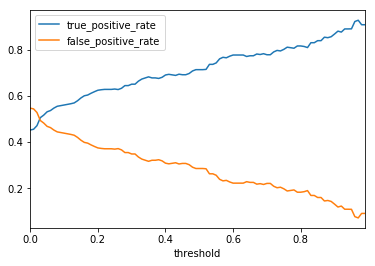

In [19]:
results[['true_positive_rate', 'false_positive_rate']].plot()

---

In [20]:
def display_stat(stat, threshold):
    optimal_stats = results.loc[threshold].to_dict()
    value = 100 * optimal_stats[stat]
    display(HTML('<h1>{s}: {v:.2f}%.</h1>'.format(s=stat, v=value)))

In [21]:
max_accuracy_threshold = results.accuracy.argmax() 

In [22]:
display(HTML('<h1>Threshold for maximum accuracy: {:.2f}%.</h1>'.format(100*max_accuracy_threshold)))

In [23]:
display_stat('accuracy', max_accuracy_threshold)
display_stat('precision', max_accuracy_threshold)
display_stat('recall', max_accuracy_threshold)

In [24]:
display_stat('false_positive_rate', max_accuracy_threshold)

<hr>

We want to minimize false positives as to avoid annoying the user:

In [25]:
optimal_threshold = results.false_positive_rate.argmin()

In [26]:
display(HTML('<h1>Threshold for minimum annoyance: {0:.2f}%.</h1>'.format(100*optimal_threshold)))

In [27]:
display_stat('accuracy', optimal_threshold)
display_stat('precision', optimal_threshold)
display_stat('recall', optimal_threshold)

In [28]:
display_stat('false_positive_rate', optimal_threshold)